Импорты:

In [27]:
import warnings
import pickle

import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import OrdinalEncoder
from kneed import KneeLocator
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff

Отключение предупреждений:

In [18]:
warnings.filterwarnings('ignore')

Для различно предобработаных наборов данных c набором признаков внешней ситуации, пробеду кластеризацию для различного количества кластеров, просчитаю мертрики кластеризации для каждого случая и отображу их на общем графике. Цель данного преребора - пределить оптимальное количество кластеров для дальнейшей кластеризации. Все графики будут сохранены в каталог images/num_of_clusters_with_soc_econ_factors.

In [122]:
first_keys=['raw','knn','iter']

preproc_quo=8
prepocesses=[f'preproc{i}' for i in range(1,preproc_quo+1)]

max_clusters=15

counter=1
for key in first_keys:
    for preproc in prepocesses:
        print(f'{counter}.\t{key}\t{preproc}')
        df_train=pd.read_csv(f'../data/preprocessed/{key}_{preproc}_train.csv')
        
        #удалю признак из-за его смысновой ненадобности пр икластеризации
        try:
            df_train.drop(columns=['subscribed'],inplace=True)
        except:
            df_train.drop(columns=['subscribed_yes','subscribed_no'],inplace=True)

        df_for_report=pd.DataFrame(columns=['num_of_clusters','inertia','silhouette'])

        # расчёт метрик для разного кол-ва кластеров
        for num_of_clusters in range(2,max_clusters+1):
            clusterizer=KMeans(n_clusters=num_of_clusters)
            labels=clusterizer.fit_predict(df_train)
            inertia=clusterizer.inertia_
            silhouette=silhouette_score(df_train,labels)
            df_for_report.loc[len(df_for_report)]=(num_of_clusters,inertia,silhouette)

        # переменная для определения точки перегиба "метод логтя"
        kl = KneeLocator(range(2,max_clusters+1),df_for_report['inertia'] , curve='convex', direction="decreasing")

        # формирование сборного графика
        fig = make_subplots(rows=2, 
                            cols=2,
                            subplot_titles=("Elbow Method", "Dendrogram", "Silhouette Score"),
                            column_widths=[0.35, 0.65],
                            specs=[[{}, {"rowspan": 2}],[{}, None]])
        
        fig.add_trace(go.Scatter(x=df_for_report['num_of_clusters'],y=df_for_report['inertia']),row=1, col=1)
        if kl.elbow is not None:
            fig.add_vline(x=kl.elbow, line_dash="dash", line_color="green",row=1,col=1)
        fig.add_trace(go.Scatter(x=df_for_report['num_of_clusters'],y=df_for_report['silhouette']),row=2, col=1)
        fig.add_traces(ff.create_dendrogram(df_train.sample(1000))['data'],rows=1,cols=2)
        fig.update_layout(height=1080, width=1920, title=f"Cluster metrics for {key} imputer and {preproc}",showlegend=False)
        
        fig.write_image(f'../images/num_of_clusters_with_soc_econ_factors/{key}_{preproc}.png')

        counter+=1

1.	raw	preproc1
2.	raw	preproc2
3.	raw	preproc3
4.	raw	preproc4
5.	raw	preproc5
6.	raw	preproc6
7.	raw	preproc7
8.	raw	preproc8
9.	knn	preproc1
10.	knn	preproc2
11.	knn	preproc3
12.	knn	preproc4
13.	knn	preproc5
14.	knn	preproc6
15.	knn	preproc7
16.	knn	preproc8
17.	iter	preproc1
18.	iter	preproc2
19.	iter	preproc3
20.	iter	preproc4
21.	iter	preproc5
22.	iter	preproc6
23.	iter	preproc7
24.	iter	preproc8


Аналогично для данных без признаков внешней социальной и экономической ситуации, вероятно данные признаки будут сильно влмять на результат кластеризации, при этом данные признаки постоянно изменяются, что исключает возможность плодотворное исспользование их в модели при выходе значение данных признаков за рамки, в которых они существуют в имеющемся наборе данных. Все графики данной ячейки будут сохранены в каталог images/num_of_clusters_without_soc_econ_factors.

In [123]:
first_keys=['raw','knn','iter']

preproc_quo=8
prepocesses=[f'preproc{i}' for i in range(1,preproc_quo+1)]

max_clusters=15

#признаки внешней сициальной и экономической ситуации
soc_econom_subset=['emp.var.rate','cons.price.idx','cons.conf.idx','euribor3m','nr.employed']

counter=1
for key in first_keys:
    for preproc in prepocesses:
        print(f'{counter}.\t{key}\t{preproc}')
        df_train=pd.read_csv(f'../data/preprocessed/{key}_{preproc}_train.csv')
        
        #удалю признак из-за его смысновой ненадобности пр икластеризации
        try:
            df_train.drop(columns=['subscribed'],inplace=True)
        except:
            df_train.drop(columns=['subscribed_yes','subscribed_no'],inplace=True)
        
        # исключу признаки внешней сициальной и экономической ситуации
        df_train.drop(columns=soc_econom_subset)

        df_for_report=pd.DataFrame(columns=['num_of_clusters','inertia','silhouette'])

        # расчёт метрик для разного кол-ва кластеров
        for num_of_clusters in range(2,max_clusters+1):
            clusterizer=KMeans(n_clusters=num_of_clusters)
            labels=clusterizer.fit_predict(df_train)
            inertia=clusterizer.inertia_
            silhouette=silhouette_score(df_train,labels)
            df_for_report.loc[len(df_for_report)]=(num_of_clusters,inertia,silhouette)

        # переменная для определения точки перегиба "метод логтя"
        kl = KneeLocator(range(2,max_clusters+1),df_for_report['inertia'] , curve='convex', direction="decreasing")

        # формирование сборного графика
        fig = make_subplots(rows=2, 
                            cols=2,
                            subplot_titles=("Elbow Method", "Dendrogram", "Silhouette Score"),
                            column_widths=[0.35, 0.65],
                            specs=[[{}, {"rowspan": 2}],[{}, None]])
        
        fig.add_trace(go.Scatter(x=df_for_report['num_of_clusters'],y=df_for_report['inertia']),row=1, col=1)
        if kl.elbow is not None:
            fig.add_vline(x=kl.elbow, line_dash="dash", line_color="green",row=1,col=1)
        fig.add_trace(go.Scatter(x=df_for_report['num_of_clusters'],y=df_for_report['silhouette']),row=2, col=1)
        fig.add_traces(ff.create_dendrogram(df_train.sample(1000))['data'],rows=1,cols=2)
        fig.update_layout(height=1080, width=1920, title=f"Cluster metrics for {key} imputer and {preproc}",showlegend=False)
        
        fig.write_image(f'../images/num_of_clusters_without_soc_econ_factors/{key}_{preproc}.png')

        counter+=1

1.	raw	preproc1
2.	raw	preproc2
3.	raw	preproc3
4.	raw	preproc4
5.	raw	preproc5
6.	raw	preproc6
7.	raw	preproc7
8.	raw	preproc8
9.	knn	preproc1
10.	knn	preproc2
11.	knn	preproc3
12.	knn	preproc4
13.	knn	preproc5
14.	knn	preproc6
15.	knn	preproc7
16.	knn	preproc8
17.	iter	preproc1
18.	iter	preproc2
19.	iter	preproc3
20.	iter	preproc4
21.	iter	preproc5
22.	iter	preproc6
23.	iter	preproc7
24.	iter	preproc8


Проанализировав графики метрик кластеризации из каталогов images/num_of_clusters_with_soc_econ_factors и images/num_of_clusters_withщге_soc_econ_factors (графики метрик кластеризации в зависимости от количества кластеров и дентограммы) для разных методов предобработки данных, было замечено, что наиболее четкие кластеры выделяются для предобработчиков 6,7,8 - кластеры получаются наиболле сбалансированные, относительно других случаев, по количеству экземпляров в кластере.

Принято решение исспользовать KKN-imputer, preprocess8 на 4 кластера методом K-means для случаев с экономическими признаками и без них. В данном случае относительно велико среднее значение силуэта и хорошая равномерноя детрограмма.

Ниже представлены графики для данного случая, для случаев с признаками внешней экономическо-соицальной ситуации и без данных признаков графики почти одинаковые.

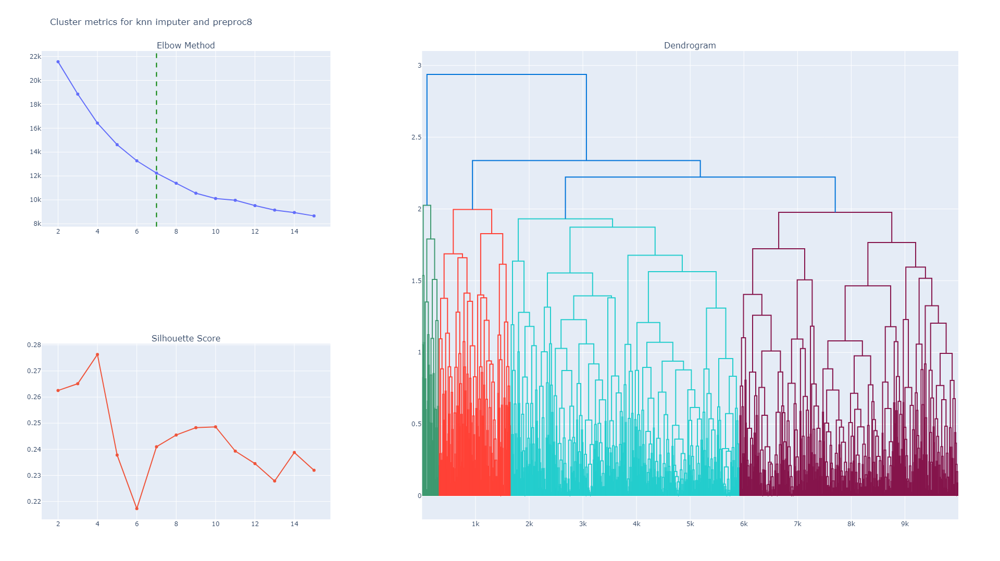

---------------------------------------------------------------------------------

Определю функцию для вывода характеристики признаков каждого из кластеров:

In [4]:
def plot_polar(df:pd.DataFrame,title:str,clusters_num:int=4,rows:int=2,cols:int=2):
    colors=['purple','yellow','red','blue']
    cluster=['Cluster 1','Cluster 2','Cluster 3','Cluster 4']

    fig = make_subplots(rows,cols,specs=[[{"type": "scatterpolar"}]*cols]*rows)

    col=1
    row=1

    for index in range(clusters_num):
        fig.add_trace(go.Scatterpolar(r=df.loc[df['label'] == index, df.columns[:-1]].describe().loc['mean'],
                                        theta=df.columns[:-1],
                                        fill='toself',
                                        fillcolor=colors[index],
                                        opacity=0.4,
                                        name=cluster[index]),row=row,col=col)
        
        # расчет позиции следующего графика
        if col<cols:
            col+=1
        else:
            col=1
            if row<rows:
                row+=1
            else:
                break

    fig.update_layout(showlegend=True,
                    title=title,
                    height=800, width=1000)
    fig.show()
    return fig

---

Изучу полученные из набора данных с социально-экономическими признаками кластеры.

Чтение набора данных с нужным предобработчиком:

In [293]:
df_train=pd.read_csv(f'../data/preprocessed/knn_preproc8_train.csv')
df_test=pd.read_csv(f'../data/preprocessed/knn_preproc8_test.csv')

df_train.drop(columns=['subscribed'],inplace=True)
df_test.drop(columns=['subscribed'],inplace=True)

Кластеризация и разметка:

In [294]:
km=KMeans(4,random_state=1)
train_cluster_labels=km.fit_predict(df_train)
test_cluster_labels=km.predict(df_test)

df_train['label']=train_cluster_labels
df_test['label']=test_cluster_labels

Пасмотрим на метки для тестового набора:

In [302]:
set(test_cluster_labels)

{3}

Всю тестовую выборку кластеризатор отнёс к одному кластеру. Данный факт объясняется следующими графиками. 

In [303]:
plot_polar(df_train,"Radar plot - Train with Social and Economics features")

Как видно первые три кластера имеют высокие значения социально-экономических признаков, относителььно кластера 4 и различаются только по иным признакам. В свою очередь кластер 4 имеет низкие показатели социально-экономических признаков, тестовая выборка тоже имеет низкие показатели социально-экономических признаков, если посмотреть на графики данных показателей в notebooks/1_data_analysis. Данные признаки изменяются со временем.

In [305]:
plot_polar(df_test,"Radar plot - Test with Social and Economics features")

Итак, все объекты из тестовой выборки отнесены к кластеру 4, так как они имеют схожие социально-экономические признаки. Однако можно заметить сильную схожесть и по другим признакам, что может говорить об преднамеренном выборе данных пользователей для обзвона по данным признакам. В кластер 4 попали клиенты из заключитеного этапа маркетиноговой компании. 

Посмотрю на кластеры в двумерном пространстве с помощью t-sne.

In [298]:
tsne_df_train=TSNE().fit_transform(df_train.drop(columns=['label']))

In [299]:
tsne_df_train_df=pd.DataFrame(tsne_df_train)
tsne_df_train_df['label']=df_train['label']

px.scatter(tsne_df_train_df,0,1,'label',title="Tsne(2)Train with Social and Economics features")

In [300]:
tsne_df_test=TSNE().fit_transform(df_test.drop(columns=['label']))

In [301]:
tsne_df_test_df=pd.DataFrame(tsne_df_test)
tsne_df_test_df['label']=df_test['label']

px.scatter(tsne_df_test_df,0,1,'label',title="Tsne(2)Test with Social and Economics features")

Социально-экономические признаки оказывают сильное влияние на кластеризацию,  однако при стабильной внешней ситуации кластеры выделяются по другим призакам (кластеры 1,2,3). 

Принято решение сделать разметку клиентов без учёта внешней социально-экономической ситуации для формирования специальных предложений для выявленых кластеров, а уже после, опираясь на социально-экономические признаки одаптировать данные предложения (продукты) в реальном времени.

------------------------------------------------------------------------------------


Изучу полученные из набора данных без социально-экономических признаков кластеры.

Чтение набора данных с нужным предобработчиком:

In [273]:
df_train=pd.read_csv(f'../data/preprocessed/knn_preproc8_train.csv')
df_test=pd.read_csv(f'../data/preprocessed/knn_preproc8_test.csv')

df_train.drop(columns=['subscribed']+soc_econom_subset,inplace=True)
df_test.drop(columns=['subscribed']+soc_econom_subset,inplace=True)

Кластеризация и разметка:

In [274]:
km=KMeans(4,random_state=1)
train_cluster_labels=km.fit_predict(df_train)
test_cluster_labels=km.predict(df_test)

df_train['label']=train_cluster_labels
df_test['label']=test_cluster_labels

Пасмотрим на метки для тестового набора:

In [275]:
set(test_cluster_labels)

{0, 1, 2, 3}

В данном случае кластеризатор тестовую выборку распределил между всеми 4-мя кластерами.

Посмотрим на признаки кластеров для тренировочной и тестовой выборки:

In [276]:
plot_polar(df_train,"Radar plot - Train without Social and Economics features")

In [277]:
plot_polar(df_test,"Radar plot - Test without Social and Economics features")

Тренировочная и тестовая выборки имеют идентичные средние значения признаков внутри кластеров, что говорит об хорошем выборе признакового пространства для кластеризации. Да, кластеры имеют схожие значения по некоторым признакам, однако они отлично различаются по други признакам. 

Дам характеристику кластерам в отмасштабированном признаковом пространстве:

    - Кластер 1: высокие значения loan
    - Кластер 2: низкие значения job
    - Кластер 3: высокие значения housing
    - Кластер 4: высокие значения job

Теоритически по набору упомянутых признаков можно неплохо восстановить данные кластеры. Так как по остальным признакам кластеры прохожи.
Сделаю через шаг.

Посмотрю на кластеры в двумерном пространстве с помощью t-sne.

In [278]:
tsne_df_train=TSNE().fit_transform(df_train.drop(columns=['label']))

In [288]:
tsne_df_train_df=pd.DataFrame(tsne_df_train)
tsne_df_train_df['label']=df_train['label']

px.scatter(tsne_df_train_df,0,1,'label',title="Tsne(2)Train without Social and Economics features")

In [281]:
tsne_df_test=TSNE().fit_transform(df_test.drop(columns=['label']))

In [287]:
tsne_df_test_df=pd.DataFrame(tsne_df_test)
tsne_df_test_df['label']=df_test['label']

px.scatter(tsne_df_test_df,0,1,'label',title="Tsne(2)Test without Social and Economics features")

Тренировочные и тестовые данные имеют идентичные распределения в призаковм пространстве без социально-экономических признаков.

---

Проведём кластеризацию поо признакам ['loan','housing','job'], по которым сильно различаются кластеры.

In [35]:
selected_columns=['loan','housing','job']

df_train=pd.read_csv(f'../data/preprocessed/knn_preproc8_train.csv')
df_test=pd.read_csv(f'../data/preprocessed/knn_preproc8_test.csv')

df_train=df_train[selected_columns]
df_test=df_test[selected_columns]

Клстеризация и разметка:

In [36]:
km=KMeans(4,random_state=1)
sel_train_cluster_labels=km.fit_predict(df_train)
sel_test_cluster_labels=km.predict(df_test)

df_train['label']=sel_train_cluster_labels
df_test['label']=sel_test_cluster_labels

Кластеры на тестовой выборке:

In [37]:
set(sel_test_cluster_labels)

{0, 1, 2, 3}

Признаки полученных кластеров:

In [25]:
fig=plot_polar(df_train,"Radar plot - Train on selected features")
with open('../app/final_polar_plot.pkl','wb') as f:
    pickle.dump(fig,f)

In [447]:
plot_polar(df_test,"Radar plot - Test on selected features")

Получились идентичные кластеры:

    - Кластер 1: высокие значения housing и низкие значения job (примерно было в кластере 3)
    - Кластер 2: высокие значения loan (примерно было в кластере 1)
    - Кластер 3: низкие значения job, нулевые значения housing и loan (примерно было в кластере 2)
    - Кластер 4: высокие значения housing, job (примерно было в кластере 4)

Посчитаю идентичность разметки:

In [448]:
label=pd.DataFrame(train_cluster_labels,columns=['label'])
sel_label=pd.DataFrame(sel_train_cluster_labels,columns=['label'])

print("Percentage of clusters matching: ",np.round(np.count_nonzero(sel_label['label'].map({0:2,1:0,2:1,3:3})==label['label'])/len(label),2))

Percentage of clusters matching:  0.26


Разметка по кластеризации на отобраных 3-ёх признаках на 26% совпадает с разметкой по кластеризации на 11-ти признаках (считая новый кластер 4  прошлым кластером 3), вероятно несовпадение в 74% связано с именением структуры кластеров. 

Посмотрю на кластеры в трёхмерном пространстве с помощью scatter3d.

In [26]:
fig=px.scatter_3d(df_train,'job','loan','housing','label',title="Train clusters in 3 selected features")
with open('../app/scatter3d.pkl','wb') as f:
    pickle.dump(fig,f)
fig.show()

Видно что кластеры легко разделить.

Посмотрим на кластере в двумерном пространстве с помощбю tsne.

In [453]:
tsne_df_train=TSNE().fit_transform(df_train.drop(columns=['label']))

In [406]:
tsne_df_train_df=pd.DataFrame(tsne_df_train)
tsne_df_train_df['label']=df_train['label']

px.scatter(tsne_df_train_df,0,1,'label',title="Tsne(2)Train on selected features")

Тестовые данные выглядят иидентично, это видно на Polar-диаграммах.

In [438]:
print('Silhouette score: ',np.round(silhouette_score(df_train.drop(columns=['label']),df_train['label']),2))

Silhouette score:  0.63


Может показаться, что класстеры стали хуже разделимы, если опираться на изображение в двумерном пространстве, однако метрика среднего силуэта увеличилась примерно на 125% и стала 0.63 вместо 0.28 по сравнению с кластеризацией на всех признаках (без социально-экономических), что говорит о значительно лучшей разделимости кластеров и признаковом пространстве ['loan','housing','job']. Так же видим отличную разделимость на 3d изображении.

---

Интерпритирую признаки кластеров, для этого узнаю как кодировались признаки:

In [38]:
# OrdinalEncoder так как он использовался в 8-ом предобработчику
encoder=OrdinalEncoder()

data_frame=pd.read_csv('../data/train_test/train_knn_imputer.csv')
subscribed=data_frame['subscribed']
data_frame=data_frame[selected_columns]
encoder.fit(data_frame)

for feature,category in zip(encoder.feature_names_in_,encoder.categories_):
    print(feature)
    for i in range(len(category)):
        print(f'\t{category[i]} - {i}')

data_frame['label']=df_train['label']
data_frame['subscribed']=subscribed

loan
	no - 0
	yes - 1
housing
	no - 0
	yes - 1
job
	admin. - 0
	blue-collar - 1
	entrepreneur - 2
	housemaid - 3
	management - 4
	retired - 5
	self-employed - 6
	services - 7
	student - 8
	technician - 9
	unemployed - 10


Также изображу информацию о проффесиях внутри кластеров 1 и 4, так как это важный признак их различия.

In [34]:
px.histogram(data_frame[data_frame['label']==0],x='job',title="Jobs in cluster 1").update_xaxes(categoryorder='total descending').show()
px.histogram(data_frame[data_frame['label']==3],x='job',title="Jobs in cluster 4").update_xaxes(categoryorder='total descending').show()

Таким образом:

    - Кластер 1: клиенты имеют кредиты на жильё и в основном имеют работу admin, blue-color, реже management и т.д.;
    - Кластер 2: клиенты имеют непогашенные кредиты;
    - Кластер 3: клиенты не имеют ни непогашенные кредиты, ни кредитов на жильё;
    - Кластер 4: клиенты имеют кредиты на жильё и в основном имеют работу technician, services, реже self-employed и т.д.;

Профессии кластеров 1 и 4 не пересекаются.

---

Посмотрю как кластеры соотносятся со множеством людей, сделавших срочный депозит:

In [17]:
for cluster in range(4):
    cluster_size=len(data_frame[data_frame['label']==cluster])
    subs_cluster_size=len(data_frame[(data_frame['label']==cluster)&(data_frame['subscribed']=='yes')])
    print(f'Subscribed part in cluster {cluster+1} ({cluster_size} clients): ',subs_cluster_size/cluster_size)

Subscribed part in cluster 1 (7549 clients):  0.053649489998675325
Subscribed part in cluster 2 (4363 clients):  0.05546642218656887
Subscribed part in cluster 3 (12311 clients):  0.054585330192510766
Subscribed part in cluster 4 (4608 clients):  0.06228298611111111


Видно, что принадлежность клиента к определённому кластеру почти не связана с тем сделал ли он депозит или нет. Видимо депозиты предлагали всем - без разбора.

---

Сохраню размеченные данные в каталог data/labeled, для обучения модели классификации:

In [19]:
df_train.to_csv('../data/labeled/train.csv',index=False)
df_test.to_csv('../data/labeled/test.csv',index=False)

---

Таким образом, клстеризация проводилась на данных с заполненными пропусками по методу KNN, с предобработчиком 8 (minmax for numeric, original_encoder-minmax for categoric, смотри раздел 2). Кластеризация проводилась по методу K-means на 4 кластера на признаках ['loan','housing','job'] - оказалось всего трёх признаков достаточно для разделения на 4 кластера в данном случае.